# Movie Recommender System
## Bret Young
### DSC 680 - T302
### 16 MARCH 2021

In [1]:
import psycopg2
import pandas as pd

# set parameters
params = {
    "host" : "localhost",
    "database" : "DSC_680",
    "user" : "bretyoung"
}

# Connect to your postgres DB
def connection(params):
    conn = None
    try:
        print("Connecting to PostgreSQL...")
        conn = psycopg2.connect(**params)
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)
        sys.exit(1)
    print("Successful connection established.")
    return conn

def sql_to_df(conn, selection, column_names):
    # Open a cursor to perform database operations
    cur = conn.cursor()

    # Execute a query
    cur.execute(selection)

    # Retrieve query results
    records = cur.fetchall()

    # close connection
    cur.close()

    # convert query to dataframe
    df = pd.DataFrame(records, columns = column_names)
    return df

In [2]:
# select rating information from PostgreSQL
column_names = ("userid", "title", "rating")

selection = "SELECT userid, m.title, rating FROM ratings r, movies m WHERE r.movieid = m.movieid AND SUBSTRING(m.title, '([0-9]{4,4})') BETWEEN '2000' AND '2010'"
# selecting movies made in 2000's due to memory issues with full dataset, 22 million records

conn = connection(params)

# ratings dataframe
df_ratings = sql_to_df(conn, selection, column_names)

Connecting to PostgreSQL...
Successful connection established.


In [3]:
df_ratings.head()

,userid,title,rating
0,232564,"Boondock Saints, The (2000)",5.0
1,232569,Erin Brockovich (2000),4.0
2,232570,Gladiator (2000),3.5
3,232570,"Crouching Tiger, Hidden Dragon (Wo hu cang lon...",5.0
4,232570,Snatch (2000),4.0


In [4]:
df_ratings.describe(include = 'all')

,userid,title,rating
count,5.943045e+06,5943045,5.943045e+06
unique,NaN,10406,NaN
top,NaN,"Lord of the Rings: The Fellowship of the Ring,...",NaN
freq,NaN,46888,NaN
mean,1.232278e+05,NaN,3.498708e+00
std,7.153748e+04,NaN,1.047263e+00
min,1.000000e+00,NaN,5.000000e-01
25%,6.060000e+04,NaN,3.000000e+00
50%,1.230070e+05,NaN,3.500000e+00
75%,1.854300e+05,NaN,4.000000e+00


In [5]:
len(df_ratings.userid.unique())

153548

In [6]:
# remove any duplicate entries
df_ratings = df_ratings.drop_duplicates()

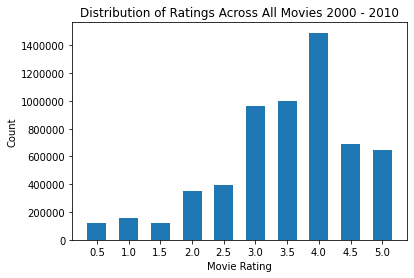

In [7]:
# View distribution of ratings 
import matplotlib.pyplot as plt

rating_count = df_ratings['rating'].value_counts() # return count for each unique value in column
rating_count = pd.DataFrame(rating_count).reset_index()
rating_count.columns = ['rating', 'count'] # rename columns after reseting the index

fig, ax = plt.subplots()

ax.bar(rating_count['rating'], height = rating_count['count'], width = 0.3)
ax.ticklabel_format(useOffset = False, style = 'plain', axis = 'y')

plt.title('Distribution of Ratings Across All Movies 2000 - 2010')
plt.xticks(rating_count['rating'])
plt.xlabel('Movie Rating')
plt.ylabel('Count')

plt.show()

In [8]:
# transpose movie title to columns and set value to rating for each user
user_df = df_ratings.groupby(['userid','title'])['rating'].max().unstack()

In [9]:
# fill NaN with 0 indicating that the user has not rated the movie
user_df.fillna(0, inplace = True)

In [10]:
user_df.head()

title,#1 Cheerleader Camp (2010),$5 a Day (2008),$9.99 (2008),'Hellboy': The Seeds of Creation (2004),'R Xmas (2001),'Salem's Lot (2004),'Twas the Night (2001),(500) Days of Summer (2009),(Untitled) (2009),...ing (2003),...,iMurders (2008),loudQUIETloud: A Film About the Pixies (2006),xXx (2002),xXx: State of the Union (2005),À l'aventure (2008),Árido Movie (2005),"Ó Paí, Ó (2007)",Üvegtigris (2001),Škola princů (2010),キサラギ (2007)
userid,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
# number of ratings conducted by a user
user_rating_count = df_ratings.groupby('userid')['rating'].agg('count')

# number of ratings a movie has received
movie_rating_count = df_ratings.groupby('title')['rating'].agg('count')

In [12]:
# Plot user rating counts
import plotly.express as px

fig = px.scatter(x = user_rating_count.index, y = user_rating_count, width = 800, height = 800, title = 'User Rating Counts', labels={'x':'UserID', 'y':'Count'})

fig.show()

fig.write_html("user_counts.html")

In [13]:
# Plot movie rating counts

fig2 = px.scatter(x = movie_rating_count.index, y = movie_rating_count, width = 800, height = 800, title = 'Movie Rating Counts', labels={'x':'', 'y':'Count'})

fig2.show()

fig2.write_html("movie_counts.html")

In [14]:
# clear memory
import gc

del user_rating_count
del movie_rating_count
del df_ratings
gc.collect()

291

In [17]:
df = user_df.values.T

df.shape

(10406, 153548)

In [18]:
# reduce dimensionality of data using ingular value decomposition
from sklearn.decomposition import TruncatedSVD

SVD = TruncatedSVD(n_components = 20, random_state = 0)
matrix = SVD.fit_transform(df)

matrix.shape

(10406, 20)

In [19]:
# Get correlation coefficients
import numpy as np
corr = np.corrcoef(matrix)

In [21]:
movie_title = user_df.columns

movie_list = list(movie_title)

movie = "Minority Report (2002)"

# find the index for the movie
movie_index = movie_list.index(movie)

In [35]:
corr_movie_index  = corr[movie_index]
corr_list = list(movie_title[(corr_movie_index > 0.8) & (corr_movie_index < 1.0)])

print(corr_list[:11])

['A.I. Artificial Intelligence (2001)', 'Beautiful Mind, A (2001)', 'Bourne Identity, The (2002)', 'Catch Me If You Can (2002)', 'Italian Job, The (2003)', 'K-PAX (2001)', 'Last Samurai, The (2003)', 'Matrix Reloaded, The (2003)', 'Matrix Revolutions, The (2003)', "Ocean's Eleven (2001)", 'Pirates of the Caribbean: The Curse of the Black Pearl (2003)']


In [44]:
# Reduce features for sparse data
from scipy.sparse import csr_matrix

csr = csr_matrix(df)

In [53]:
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import GridSearchCV

acc = []


# Create knn model
knn = NearestNeighbors(n_neighbors = 25, n_jobs = -1)
knn.fit(csr)

NearestNeighbors(n_jobs=-1, n_neighbors=25)

In [74]:
def get_movie_recommendation(movie_name):
    n_movies_to_reccomend = 10 
    
    movie_idx = movie_list.index(movie)
    
    distances , indices = knn.kneighbors(csr[movie_idx], n_neighbors = n_movies_to_reccomend + 1) # adding 1 because the original movie title is included
    
    # Create list of movies to recommend
    movies = []
    
    for i in indices:
        for j in i:
            movies.append(movie_list[j])
    return movies

In [75]:
get_movie_recommendation(movie)

['Minority Report (2002)',
 'Spider-Man (2002)',
 'Matrix Reloaded, The (2003)',
 'Star Wars: Episode II - Attack of the Clones (2002)',
 'Signs (2002)',
 'X2: X-Men United (2003)',
 'Matrix Revolutions, The (2003)',
 'Spider-Man 2 (2004)',
 'Men in Black II (a.k.a. MIIB) (a.k.a. MIB 2) (2002)',
 'I, Robot (2004)',
 'Star Wars: Episode III - Revenge of the Sith (2005)']